In [1]:
# Standard libraries
import os
import sys
import math
import warnings
import unicodedata
from math import pi
from urllib.request import urlopen
import time

# Data handling
import pandas as pd
import numpy as np

# Web scraping
import requests
from bs4 import BeautifulSoup

# Visualization
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.ticker as ticker
import matplotlib.colors as mcolors
import matplotlib.gridspec as gridspec
import matplotlib.image as image
import matplotlib.patheffects as path_effects
import matplotlib.font_manager as fm
from matplotlib import cm
from matplotlib.patheffects import withStroke
import seaborn as sns
import matplotlib.style as style

# Highlighting and annotation
from highlight_text import fig_text
from adjustText import adjust_text

# Image handling
from PIL import Image
import urllib

# Stats & clustering
from sklearn.cluster import KMeans
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler

# String matching
from fuzzywuzzy import fuzz, process

# Charting
from mplsoccer import PyPizza, add_image, FontManager, Radar

# Tabular display
from tabulate import tabulate

# Suppress warnings
warnings.filterwarnings('ignore')

# Plot style
style.use('fivethirtyeight')

# Ensure pandas doesn't truncate wide tables
pd.options.display.max_columns = None


# Local import
module_path = os.path.abspath(os.path.join('/Users/stephenahiabah/Desktop/Code/cannoniq'))
if module_path not in sys.path:
    sys.path.append(module_path)

import FBREF_Aggregations as fbref

from CannonIQ_Charts import CannoniqCharts



/Users/stephenahiabah/.pyenv/versions/3.11.0/lib/python3.11/site-packages/fuzzywuzzy/fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')


In [2]:
player_role_templates = {
    "Ball Playing CB": [
        # Defensive
        "Tkl%", "Int", "Blocks", "Passes Blocked", "Clr",
        # Possession
        "Total - Cmp%", "Short - Cmp%", "Long - Cmp%", "PrgP", "Carries - PrgDist",
        # Attacking
        "xA", "Ast", "KP", "Sh/90", "G/Sh"
    ],
    "Classic CB": [
        # Defensive
        "Tkl%", "Int", "Clr", "Recov", "Shots Blocked",
        # Possession
        "Touches", "Total - Att", "Total - Cmp%", "Long - Cmp%", "Rec",
        # Attacking
        "xG", "Sh/90", "Ast", "SoT%", "KP"
    ],
    "Classic Fullback": [
        # Defensive
        "Tkl%", "Int", "Blocks", "Tkl+Int", "Passes Blocked",
        # Possession
        "Touches", "Carries", "Carries - TotDist", "PrgR", "Short - Cmp%",
        # Attacking
        "xA", "Ast", "KP", "CrsPA", "1/3"
    ],
    "Inverted Fullback": [
        # Defensive
        "Tkl%", "Int", "Blocks", "Pressures", "Dribblers- Tkl",
        # Possession
        "Total - Cmp%", "Short - Cmp%", "Carries - PrgDist", "PrgP", "Touches",
        # Attacking
        "xA", "KP", "Ast", "Sh/90", "SCA90"
    ],
    "Attacking Fullback": [
        # Defensive
        "Tkl%", "Tkl+Int", "Blocks", "Int", "Dribblers- Tkl",
        # Possession
        "Carries - PrgC", "Carries - PrgDist", "Touches", "Take Ons - Attempted", "PrgR",
        # Attacking
        "xA", "KP", "CrsPA", "Ast", "SCA - PassLive"
    ],
    "Destroyer DM": [
        # Defensive
        "Tkl+Int", "Int", "Passes Blocked", "Pressures", "Blocks",
        # Possession
        "Touches", "Total - Cmp%", "Carries - PrgDist", "Short - Cmp%", "Rec",
        # Attacking
        "xA", "Long - Cmp%", "Ast", "Sh/90", "KP"
    ],
    "Deep Lying Playmaker CM": [
        # Defensive
        "Tkl%", "Passes Blocked", "Tkl+Int", "Shots Blocked", "Int",
        # Possession
        "Total - Cmp%", "Short - Cmp%", "PrgP", "Carries - PrgDist", "Touches",
        # Attacking
        "xA", "Long - Cmp%", "Ast", "Sh/90", "KP"
    ],
    "Box to Box CM": [
        # Defensive
        "Tkl%", "Tkl+Int", "Int", "Blocks", "Passes Blocked",
        # Possession
        "Carries - PrgDist", "Carries - PrgC", "Touches", "Short - Cmp%", "Rec",
        # Attacking
        "xG", "xA", "KP", "Ast", "Sh/90"
    ],
    "Playmaker CM": [
        # Defensive
        "Tkl%", "Int", "Passes Blocked", "Blocks", "Tkl+Int",
        # Possession
        "Touches", "Carries - PrgDist", "Short - Cmp%", "Total - Cmp%", "PrgP",
        # Attacking
        "xA", "Ast", "KP", "SCA90", "GCA90"
    ],
    "Classic AM": [
        # Defensive
        "Tkl%", "Tkl+Int", "Pressures", "Int", "Blocks",
        # Possession
        "Touches", "Carries - PrgC", "Short - Cmp%", "Total - Cmp%", "Rec",
        # Attacking
        "xA", "Ast", "KP", "Sh/90", "xG"
    ],
    "Inside Forward": [
        # Defensive
        "Tkl%", "Tkl+Int", "Int", "Blocks", "Dribblers- Tkl",
        # Possession
        "Carries - PrgC", "Carries - PrgDist", "Touches", "Take Ons - Attempted", "PrgR",
        # Attacking
        "xG", "xA", "KP", "Ast", "Sh/90"
    ],
    "Winger": [
        # Defensive
        "Tkl%", "Tkl+Int", "Blocks", "Int", "Dribblers- Tkl",
        # Possession
        "Carries - PrgDist", "Carries - PrgC", "Touches", "Take Ons - Attempted", "1/3",
        # Attacking
        "xA", "KP", "Ast", "CrsPA", "Sh/90"
    ],
    "Center Forward": [
        # Defensive
        "Tkl%", "Int", "Tkl+Int", "Blocks", "Pressures",
        # Possession
        "Touches", "Rec", "Carries - PrgC", "Short - Cmp%", "Fld",
        # Attacking
        "xG", "xA", "KP", "Ast", "Sh/90"
    ],
    "False 9": [
        # Defensive
        "Tkl%", "Tkl+Int", "Int", "Blocks", "Pressures",
        # Possession
        "Touches", "Total - Cmp%", "Short - Cmp%", "Carries - PrgC", "Rec",
        # Attacking
        "xG", "xA", "KP", "Ast", "SCA - PassLive"
    ]
}


In [3]:
clean_stat_mapping = {
    # Defensive
    "Tkl%": "Tackle Success %",
    "Int": "Interceptions",
    "Blocks": "Blocks",
    "Passes Blocked": "Passes Blocked",
    "Clr": "Clearances",
    "Recov": "Recoveries",
    "Shots Blocked": "Shots Blocked",
    "Tkl+Int": "Tackles + Interceptions",
    "Dribblers- Tkl": "Tackles vs Dribblers",
    "Pressures": "Pressures",
    "CrdY": "Yellow Cards",
    "Fls": "Fouls Committed",

    # Possession
    "Touches": "Touches",
    "Carries": "Carries",
    "Carries - TotDist": "Carry Distance (Total)",
    "Carries - PrgDist": "Progressive Carry Distance",
    "Carries - PrgC": "Progressive Carries",
    "Carries - 1/3": "Carries into Final Third",
    "Carries - CPA": "Carries into Penalty Area",
    "Take Ons - Attempted": "Dribbles Attempted",
    "Rec": "Passes Received",
    "Total - Cmp%": "Passing % (Total)",
    "Total - Att": "Passes Attempted (Total)",
    "Short - Cmp%": "Passing % (Short)",
    "Long - Cmp%": "Passing % (Long)",
    "PrgR": "Progressive Receptions",
    "PrgP": "Progressive Passes",
    "Fld": "Fouls Drawn",

    # Attacking
    "xA": "Expected Assists (xA)",
    "Ast": "Assists",
    "KP": "Key Passes",
    "Sh/90": "Shots per 90",
    "xG": "Expected Goals (xG)",
    "CrsPA": "Crosses into Penalty Area",
    "SCA90": "Shot Creating Actions /90",
    "GCA90": "Goal Creating Actions /90",
    "1/3": "Passes into Final Third",
    "PPA": "Passes into Penalty Area",
    "SoT%": "Shots on Target %",
    "G/Sh": "Goals per Shot",
    "npxG": "Non-Penalty xG",
    "Long - Cmp%": "Passing % (Long)",
    "SCA - PassLive": "SCA – Live Pass",
    "GCA - PassLive": "GCA – Live Pass",
    "SCA - PassDead": "SCA – Dead Ball",
    "GCA - PassDead": "GCA – Dead Ball"
}


In [4]:
charts = CannoniqCharts(
    player_role_templates=player_role_templates,
    clean_stat_mapping=clean_stat_mapping
)
# Cannoniq_DB = charts.create_cannoniq_database()
Cannoniq_DB = pd.read_csv(
    '/Users/stephenahiabah/Desktop/Code/cannoniq/CSVs/CannonIQ_DB.csv',
    index_col=0
)
# Cannoniq_DB = Cannoniq_DB.drop(columns=['Unnamed: 0'])
Cannoniq_DB = Cannoniq_DB.drop(columns=['Unnamed: 0'], errors='ignore')
Cannoniq_DB.reset_index(inplace=True)

In [5]:
Cannoniq_DB

,Player,Nation,Pos,Squad,position_group,Passing_Score,Defending_Score,Creation_Score,Shooting_Score,player_name_match,scouting_url,match_logs,index,Age,Born,90s,Touches,Def Pen,Def 3rd,Mid 3rd,Att 3rd,Att Pen,Live,Take Ons - Attempted,Succ,Succ%,Tkld,Tkld%,Carries,Carries - TotDist,Carries - PrgDist,Carries - PrgC,Carries - 1/3,Carries - CPA,Carries - Mis,Carries - Dis,Rec,PrgR,CrdY,CrdR,2CrdY,Fls,Fld,Off,Crs,Int,TklW,PKwon,PKcon,OG,Recov,Won,Lost,Won%,Total - Cmp,Total - Att,Total - Cmp%,TotDist,PrgDist,Short - Cmp,Short - Att,Short - Cmp%,Medium - Cmp,Medium - Att,Medium - Cmp%,Long - Cmp,Long - Att,Long - Cmp%,Ast,xAG,xA,A-xAG,KP,1/3,PPA,CrsPA,PrgP,Total - Tkl,Tackles - Def 3rd,Tackles - Mid 3rd,Tackles - Att 3rd,Dribblers- Tkl,Att,Tkl%,Total Blocks,Shots Blocked,Passes Blocked,Tkl+Int,Clr,Err,Gls,Sh,SoT,SoT%,Sh/90,SoT/90,G/Sh,G/SoT,Dist,FK,PK,PKatt,xG,npxG,npxG/Sh,G-xG,np:G-xG,SCA,SCA90,SCA - PassLive,SCA - PassDead,SCA - Sh,SCA - Fld,SCA - Def,GCA,GCA90,GCA - PassLive,GCA - PassDead,GCA - Sh,GCA - Fld,GCA - Def,Dead,TB,Sw,TI,CK,In,Out,Str,Cmp,Blocks
0,Max Aarons,eng ENG,DF,Bournemouth,Defender,5.644444,6.252431,5.102952,4.500000,Max Aarons,https://fbref.com/en/players/774cf58b/scout/36...,https://fbref.com/en/players/774cf58b/matchlog...,0,24,2000,1.0,73.000000,2.000000,19.000000,40.000000,15.000000,0.000000,73.000000,2.000000,0.000000,0.0,1.000000,50.0,41.000000,152.000000,68.000000,1.000000,0.000000,0.000000,1.000000,0.000000,40.000000,3.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,50.000000,63.000000,79.4,887.000000,361.000000,21.000000,25.000000,84.0,24.000000,29.000000,82.8,4.000000,7.000000,57.1,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,0.000000,0.000000,8.000000,2.000000,1.000000,1.000000,0.000000,1.000000,1.000000,100.0,3.000000,1.000000,2.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.00,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,2.09,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.00000,0.000000,0.0,12.000000,0.000000,0.000000,10.000000,0.000000,0.000000,0.000000,0.0,50.000000,1.000000
1,Rodrigo Abajas,es ESP,DF,Valencia,Defender,5.280621,6.487013,4.972562,4.501269,Rodrigo Abajas,https://fbref.com/en/players/69c99fce/scout/36...,https://fbref.com/en/players/69c99fce/matchlog...,2,21,2003,0.7,51.428571,1.428571,11.428571,27.142857,12.857143,1.428571,51.428571,1.428571,1.428571,100.0,0.000000,0.0,18.571429,144.285714,95.714286,4.285714,2.857143,1.428571,0.000000,2.857143,22.857143,4.285714,1.428571,0.0,0.0,2.857143,0.000000,1.428571,1.428571,1.428571,2.857143,0.000000,0.0,0.0,2.857143,0.000000,1.428571,0.0,24.285714,41.428571,58.6,382.857143,157.142857,15.714286,20.000000,78.6,5.714286,10.000000,57.1,2.857143,10.000000,28.6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.857143,4.285714,2.857143,1.428571,0.000000,4.285714,4.285714,100.0,1.428571,0.000000,1.428571,5.714286,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.00,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.00000,0.000000,0.0,11.428571,0.000000,0.000000,11.428571,0.000000,0.000000,0.000000,0.0,24.285714,2.857143
2,James Abankwah,ie IRL,"DF,MF",Udinese,Defender,5.550083,5.869027,4.517253,4.501903,James Abankwah,https://fbref.com/en/players/4b7a9fcc/scout/36...,https://fbref.com/en/players/4b7a9fcc/matchlog...,3,20,2004,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.0,0.0,4.000000,3.000000,0.000000,0.000000,1.000000,2.000000,0.000000,0.0,0.0,7.000000,2.000000,2.000000,50.0,36.000000,46.000000,78.3,614.000000,206.0000

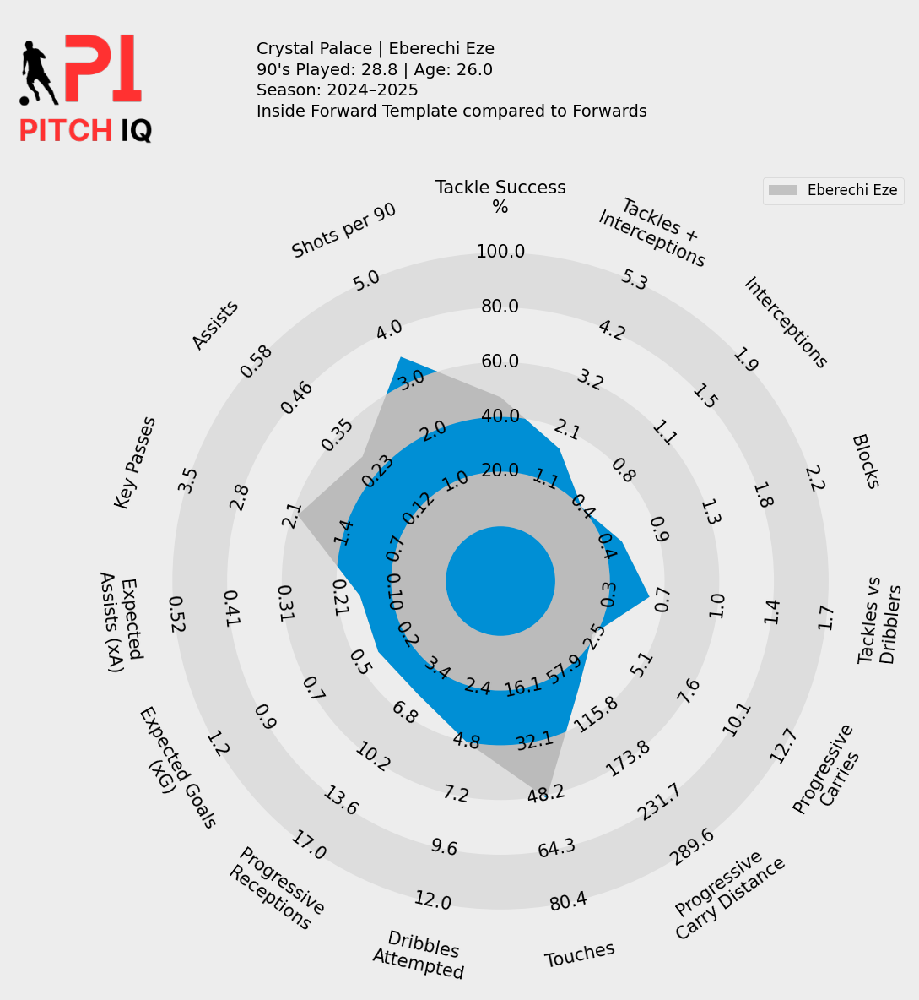

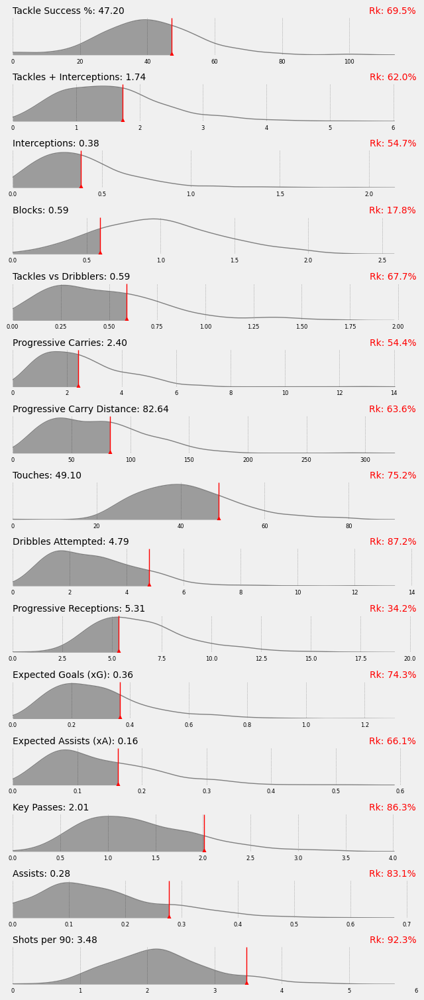

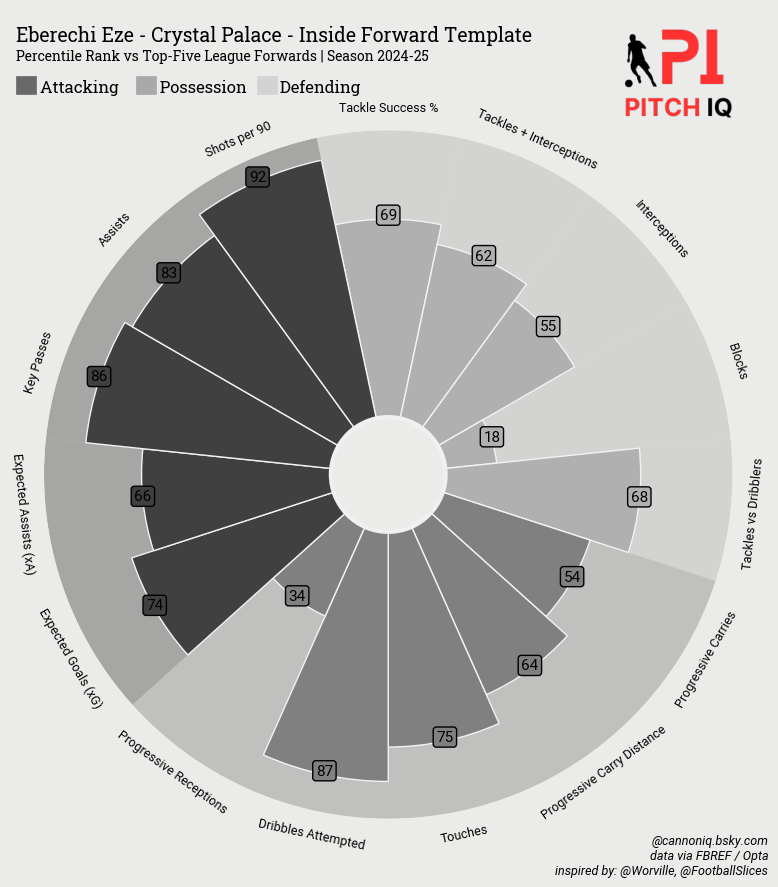

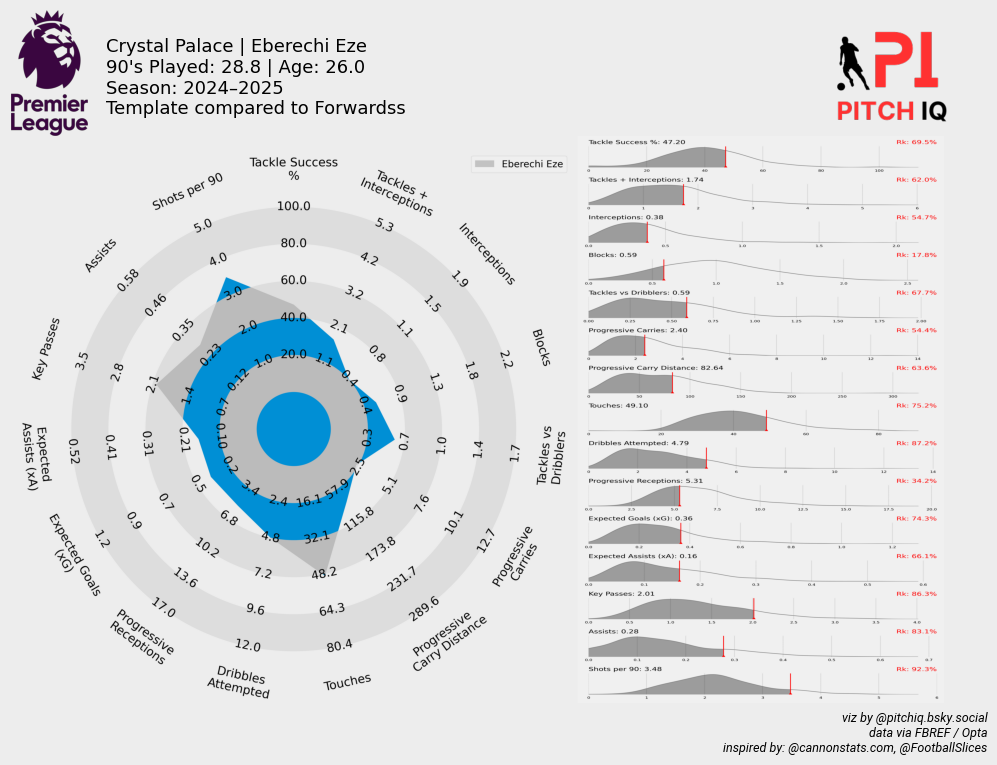

'Player_profiles/Eberechi Eze/Eberechi Eze_combined_profile.png'

In [6]:
charts.generate_full_player_profile_with_pizza("Eberechi Eze", "Inside Forward", df=Cannoniq_DB)


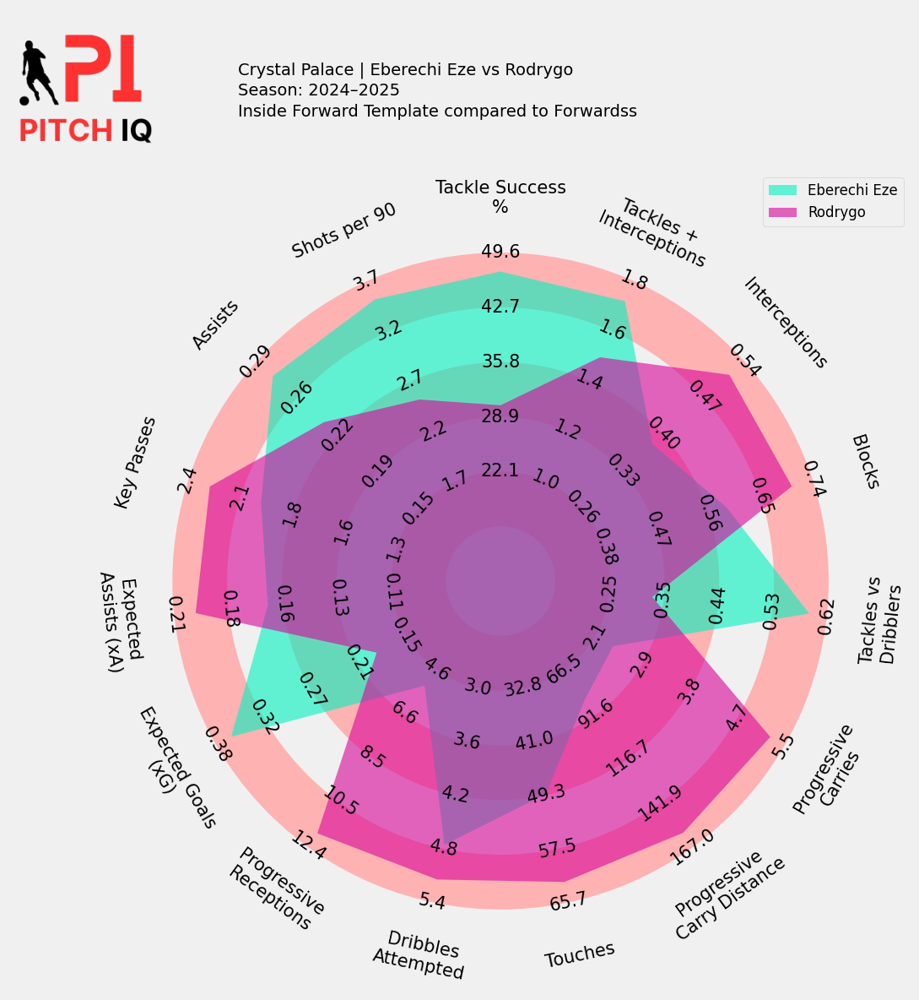

In [7]:
charts.plot_role_based_comparison("Eberechi Eze", role="Inside Forward", df=Cannoniq_DB, comparative_list=["Rodrygo"])


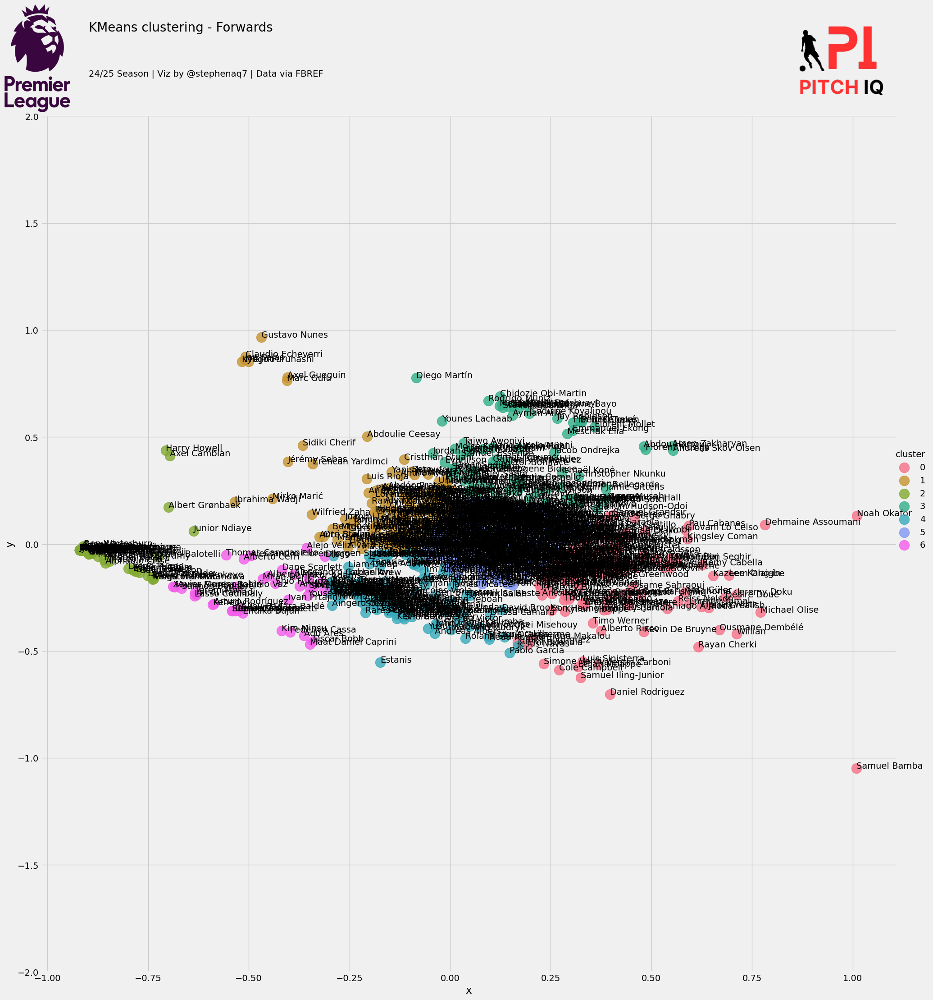

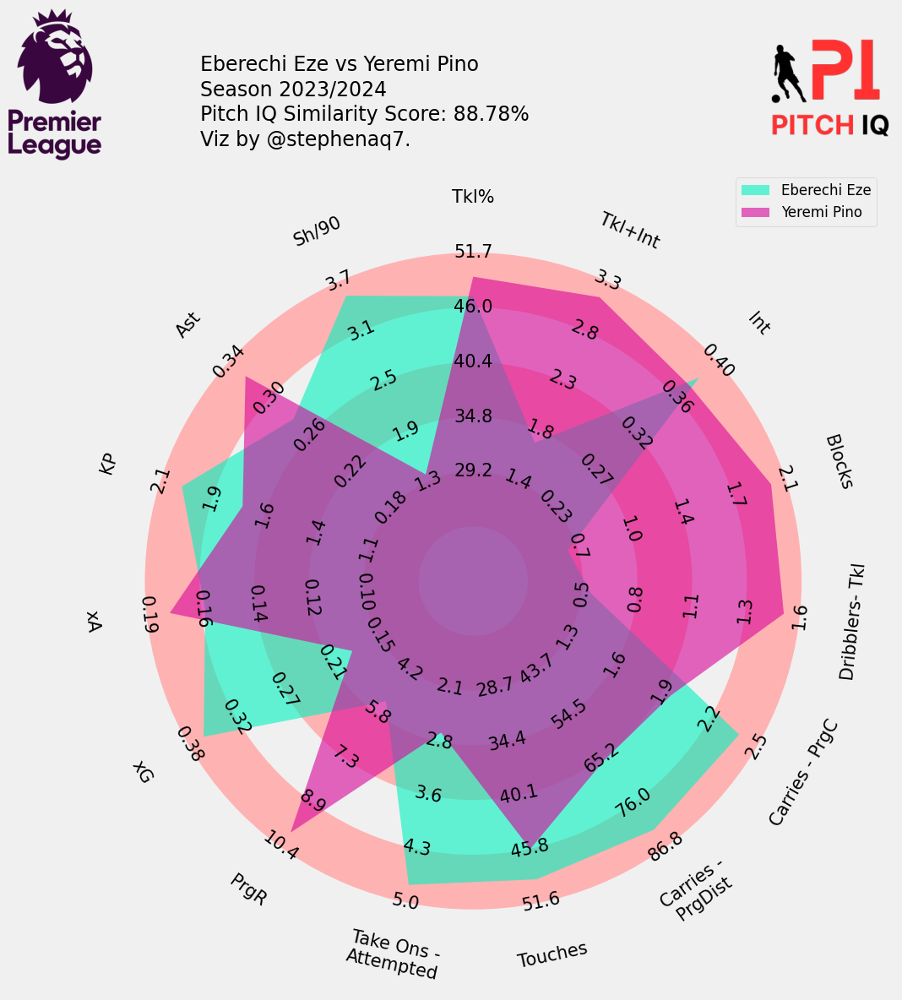

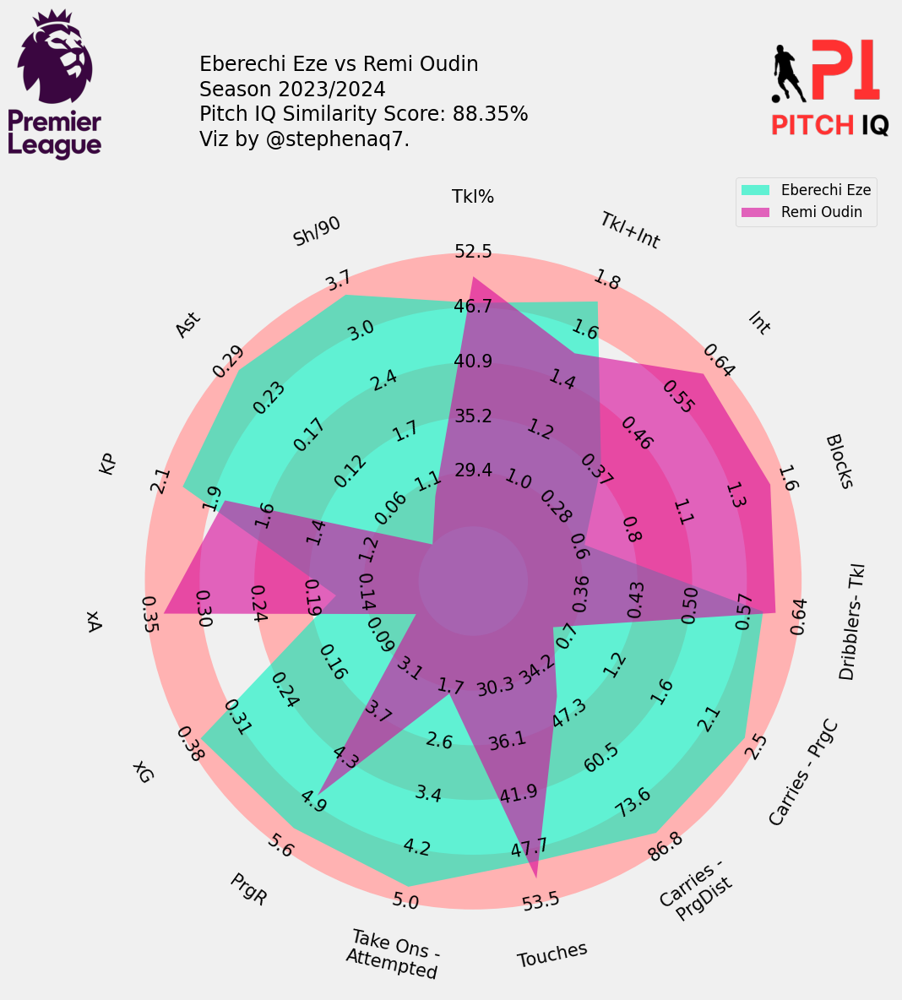

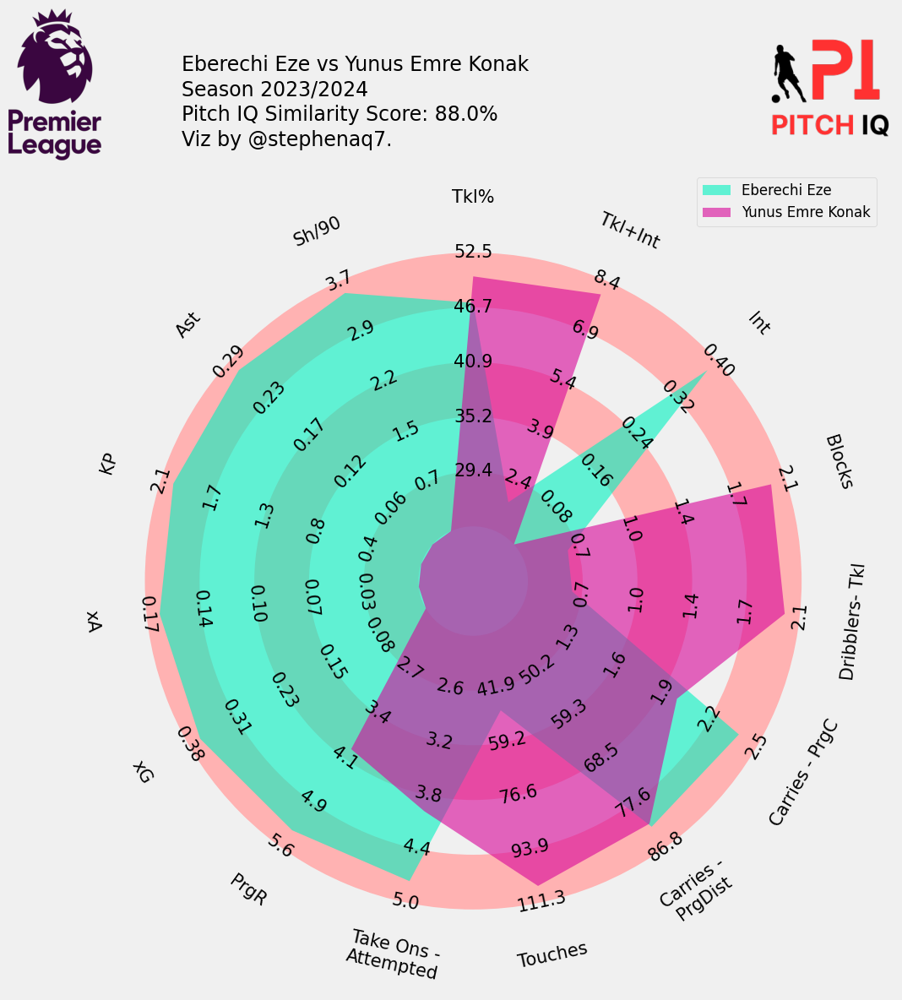

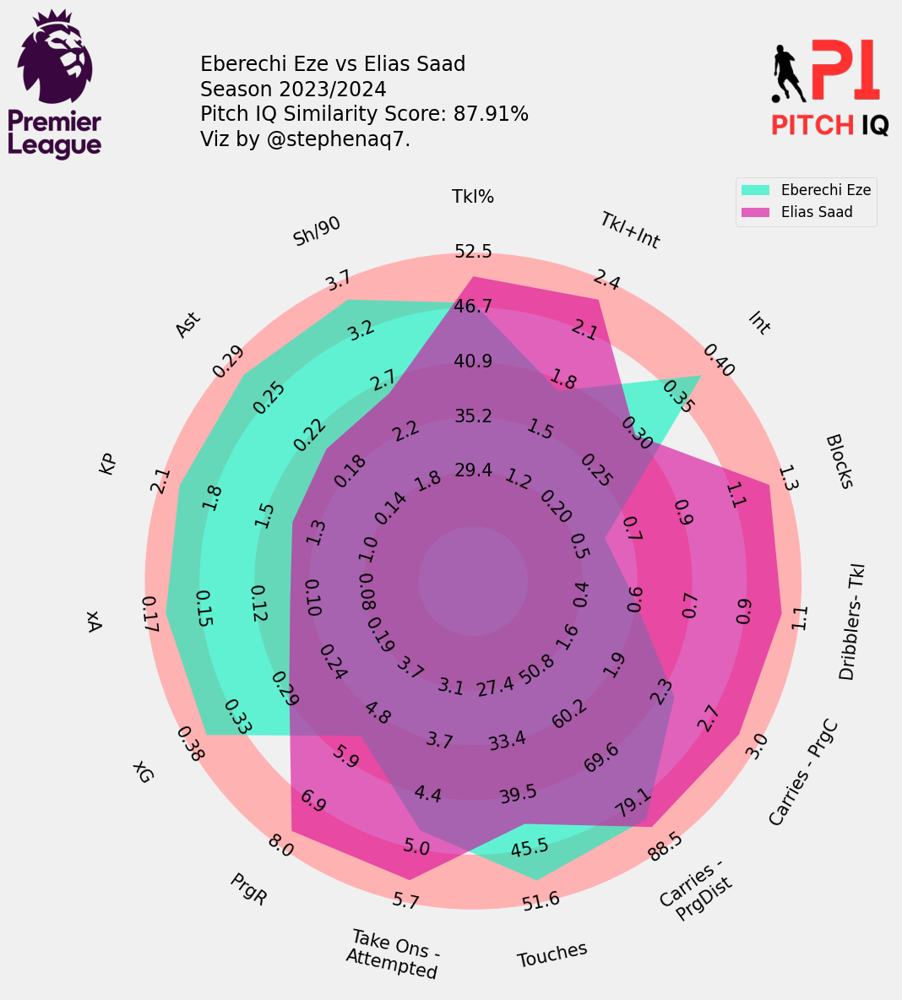

...

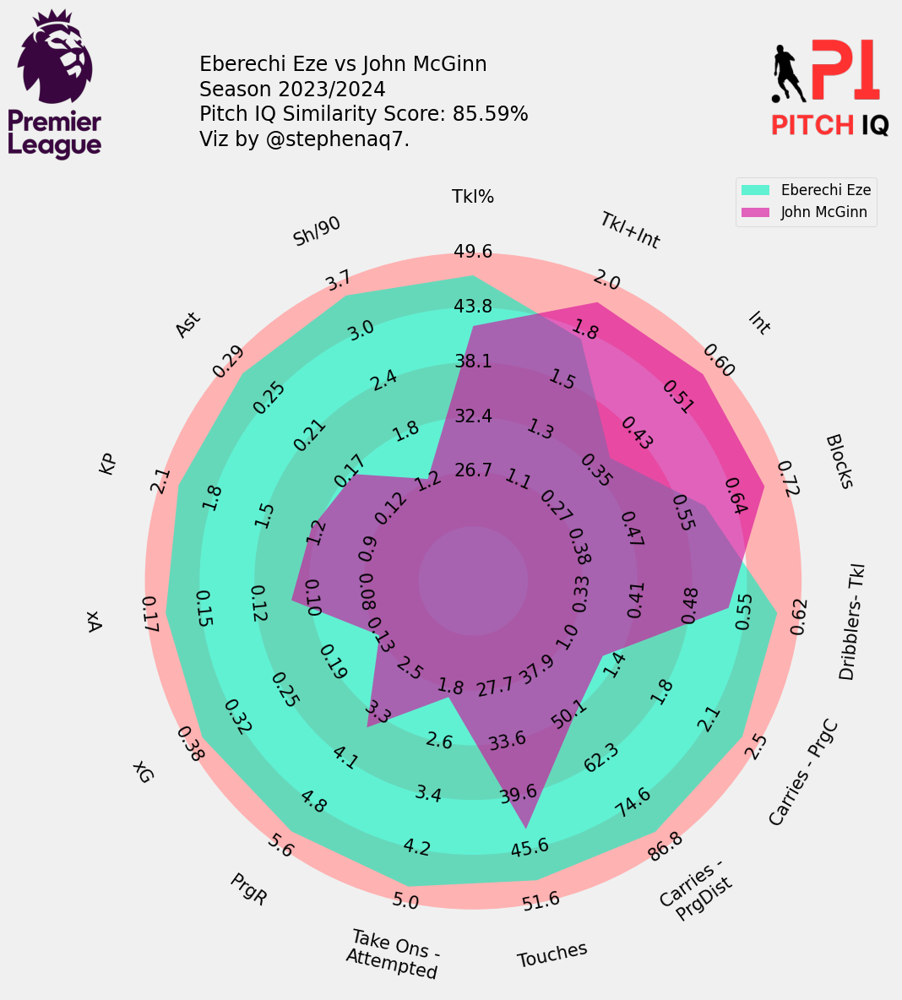

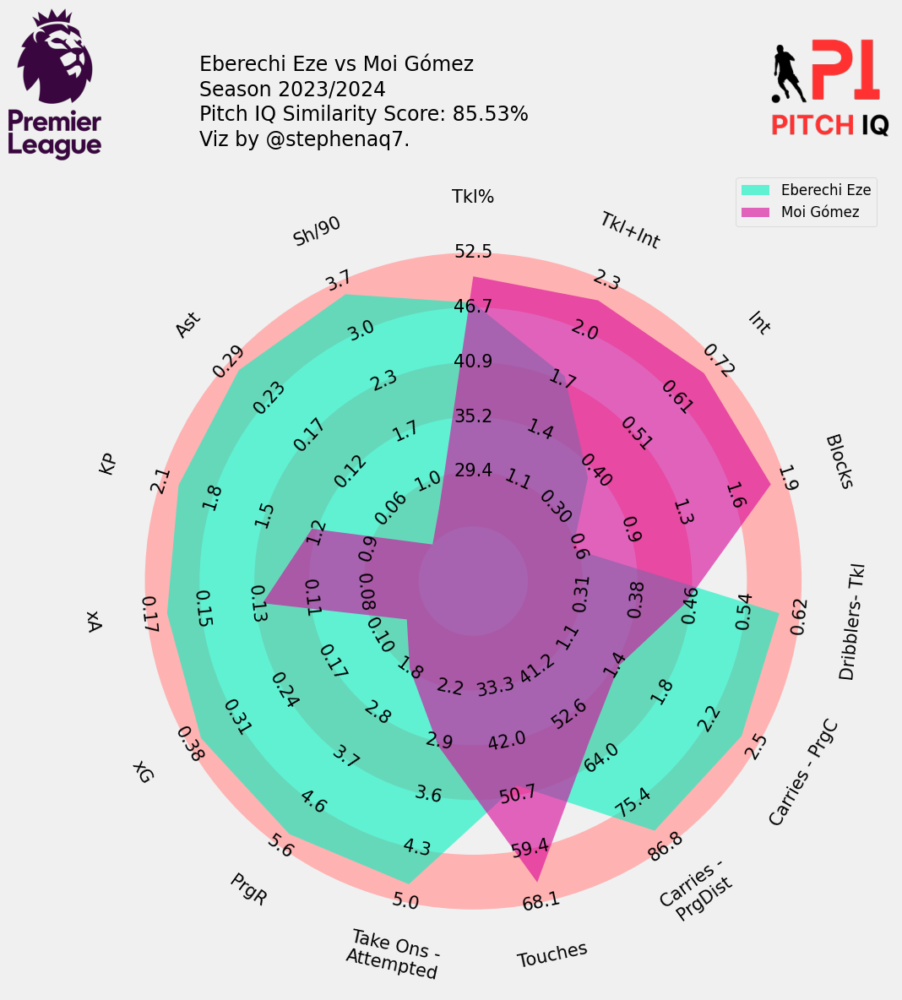

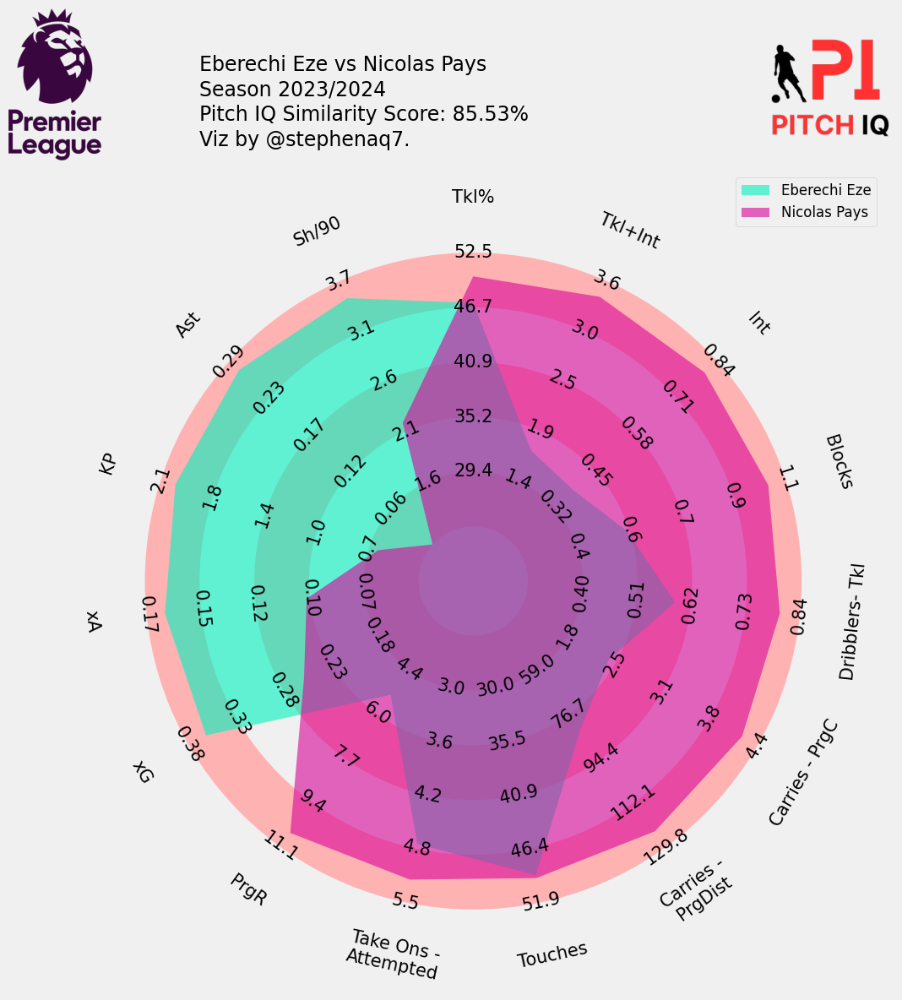

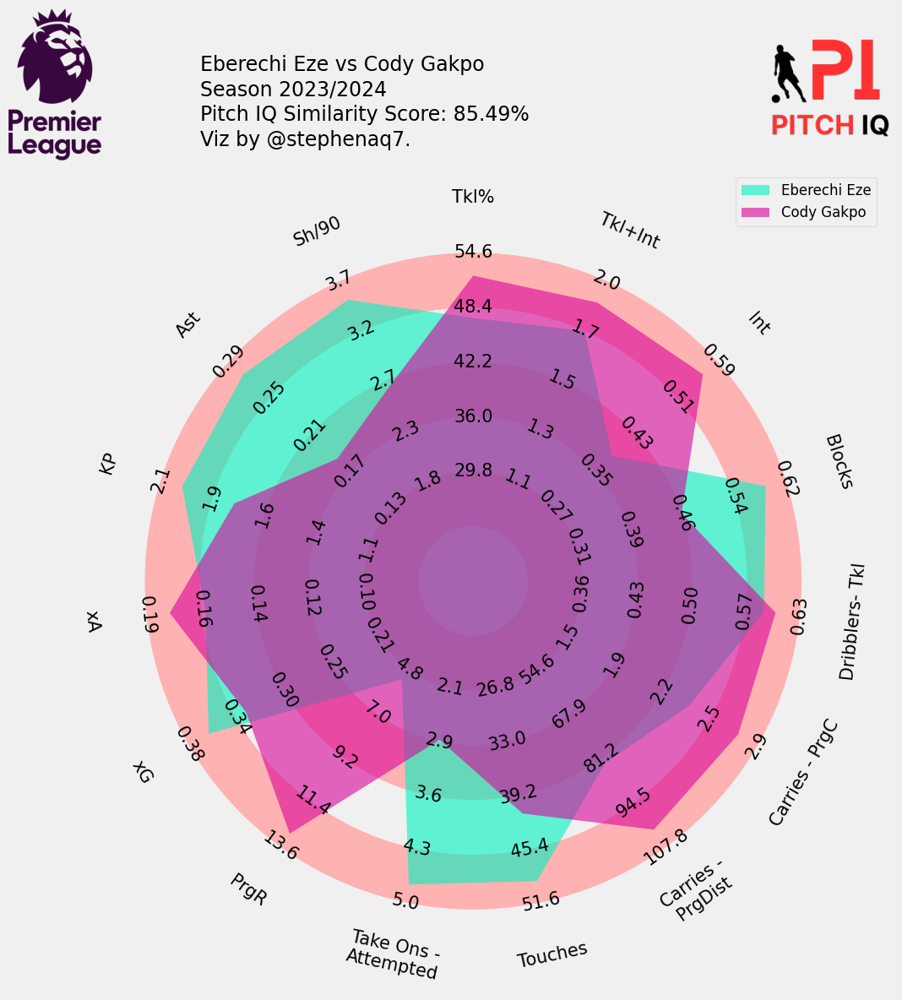

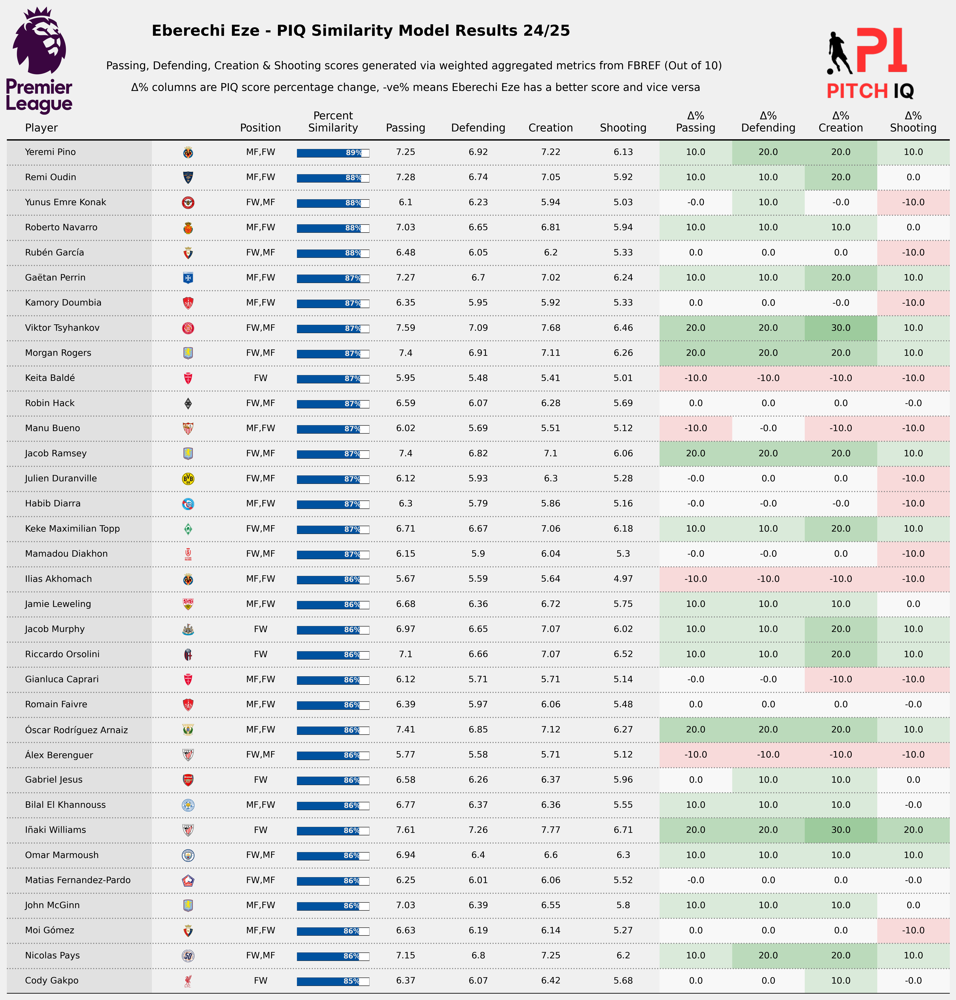

<Figure size 640x480 with 0 Axes>

In [8]:
df_result = charts.generate_full_similarity_analysis(
    player_name='Eberechi Eze',
    role='Inside Forward',
    Cannoniq_DB=Cannoniq_DB
)
